# SPAD Time-Rabi Batch Analysis — Notebook README

> **Goal**: Load one or more pre-processed time-Rabi datasets (`.npz` exports from `SPAD_time_rabi_hermesread.ipynb`), compute weighted-average contrast curves vs pulse duration, fit a damped cosine per pixel, and produce diagnostic plots.

---
## Prerequisites
All input files must already be generated by `SPAD_time_rabi_hermesread.ipynb` (or `batch_time_rabi_hermesread.py`). This notebook does **not** load raw `.hrm` files or perform background subtraction — that is handled upstream.

---
## Configuration (Cell 4)

Set `spad_processed_subdir` to the name of the sub-directory (under `spad_processed_dir`, i.e. `<spad_dir>/processed/`) that holds the `.npz` files for the run you want to analyze:

```python
spad_processed_subdir = '513_time_rabi_gradient_tracking_143612_20260716-140832'
```

This directory is created automatically by `batch_time_rabi_hermesread.py` (named `<dataset_tag>_<run_timestamp>`, printed by that script as it runs). The loader cell (Cell 5) globs **every** `.npz` file in that directory and loads them all — their contrasts are weighted-averaged by `n_complete_reps` before fitting. No more manually listing individual filenames.

---
## Memory variables after loading (Cell 5)
| Variable | Shape | Description |
|---|---|---|
| `spad_processed_files` | list of str | `.npz` filenames discovered in `spad_processed_subdir`, sorted |
| `sig_avg_cps_bgsub_all` | `(N_files, N, rows, cols)` | Background-subtracted signal, counts/s/pixel |
| `ref_avg_cps_bgsub_all` | `(N_files, N, rows, cols)` | Background-subtracted reference, counts/s/pixel |
| `n_complete_reps_all` | list of int | Repetition counts per file (used as weights) |
| `t_vec` | `(N,)` | Pulse duration sweep axis (ns) |
| `bright_rc` | `(row, col)` | Brightest pixel in the mean reference frame |

---
## Analysis cells (in order)
1. **Reference frame image** — plots mean reference frame and locates `bright_rc` (brightest pixel), used as the array centre for all subsequent per-pixel indexing.
2. **Total counts + contrast** — sums all pixels and plots raw signal/reference counts and the aggregate contrast curve per file.
3. **3×3 raw traces** — plots signal and reference cps for a 3×3 sparse grid (`bright_rc ± (0, 2)`) without fitting.
4. **Weighted-average contrast (all pixels)** — computes weighted average across files and plots the full-array Rabi contrast curve.
5. **3×3 weighted-average contrast** — computes `pixel_data` (contrast per pixel, no fit) for the 3×3 grid and plots it with shared y-axis limits.
6. **FFT of the 3×3 traces** — power spectrum per pixel; computes the dominant (non-DC) frequency per pixel and averages it across all pixels into `freq_guess_avg`, used as the fit frequency guess in the next cell.
7. **3×3 damped-cosine fit** — fits `offset + slope*t + amp*cos(2π·freq·t + phase)·exp(-t/decay)` to each pixel using `freq_guess_avg` as the frequency initial guess; `FIT_ROW` can restrict fitting to a single grid row; prints π-pulse time, decay, amplitude, and SNR (amplitude / fit-residual RMS) per pixel.

---
## Notes
- `bright_rc` is recomputed per file in some cells and used from the last file's value in others — rerun from Cell 5 if you change `spad_processed_subdir`.
- All pixel indexing uses the sparse step of ±2 (not ±1) for the 3×3 grid to match the NV array pitch.
- The fit cell depends on `pixel_data` (from cell 5) and `freq_guess_avg` (from the FFT cell) — run them in order.

In [192]:
import sys
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from types import SimpleNamespace
from pathlib import Path
import re
from importlib import reload
from scipy.optimize import curve_fit

def find_workspace_root(start: Path) -> Path:
    start = start.resolve()
    for p in [start, *start.parents]:
        if (p / 'experiment-main').exists():
            return p
    raise RuntimeError('Could not find workspace root containing experiment-main')

WORKSPACE = find_workspace_root(Path.cwd())
sys.path.insert(0, str(WORKSPACE / 'experiment-main'))
from qua_tools_nv2.dataset import DatasetReader

In [193]:
spad_processed_dir = r'C:\Users\SPUD1\Documents\experiment_workspace\SPAD data\processed'
qm_dir = r'C:\Users\SPUD1\Documents\experiment_workspace\qua-libs\Quantum-Control-Applications\Optically addressable spin qubits\NV2_array_SPAD'

In [194]:
# Sub-directory inside spad_processed_dir containing this run's .npz files.
# Created automatically by batch_time_rabi_hermesread.py as '<dataset_tag>_<run_timestamp>'
# (printed by that script as "Output directory : ..." when it runs).
spad_processed_subdir = '_563_time_rabi_gradient_tracking_151243_20260719-133137'


In [195]:
processed_loaded = False
qm_file_from_processed = None
processed_metadata_export = None

def _load_processed_header_txt(header_path: Path) -> dict:
    text = header_path.read_text(encoding='utf-8')
    json_start = text.find('{')
    if json_start < 0:
        raise ValueError(f"No JSON object found in header file: {header_path}")
    return json.loads(text[json_start:])


processed_dir = Path(spad_processed_dir) / spad_processed_subdir
if not processed_dir.is_dir():
    raise FileNotFoundError(f"Processed sub-directory not found: {processed_dir}")

spad_processed_files = sorted(p.name for p in processed_dir.glob('*.npz'))
if not spad_processed_files:
    raise FileNotFoundError(f"No .npz files found in: {processed_dir}")

print(f"Found {len(spad_processed_files)} processed file(s) in {processed_dir}:")
for f in spad_processed_files:
    print(f"  {f}")
print()

sig_avg_cps_bgsub_all = []
ref_avg_cps_bgsub_all = []
n_complete_reps_all = []

for spad_processed_file in spad_processed_files:
    processed_path = processed_dir / spad_processed_file

    print(f"Loading processed arrays from: {processed_path}")

    with np.load(processed_path, allow_pickle=True) as npz:
        sig_avg_cps_bgsub = np.asarray(npz['sig_avg_cps_bgsub'])
        ref_avg_cps_bgsub = np.asarray(npz['ref_avg_cps_bgsub'])
        #t_vec = np.asarray(npz['t_vec'])
        t_vec = 4*np.asarray(npz['t_vec'])
        n_complete_reps = int(np.asarray(npz['n_complete_reps']).item())

    processed_loaded = True

    print(
        "Loaded processed arrays:\n"
        f"  sig_avg_cps_bgsub : {sig_avg_cps_bgsub.shape}\n"
        f"  ref_avg_cps_bgsub : {ref_avg_cps_bgsub.shape}\n"
        f"  t_vec   : {t_vec.shape}  "
        f"({t_vec.min():.1f} – {t_vec.max():.1f} ns)\n"
        f"  n_complete_reps   : {n_complete_reps}\n"
    )

    processed_header_path = processed_path.parent / f"{processed_path.stem}_header.txt"
    if processed_header_path.exists():
        processed_metadata_export = _load_processed_header_txt(processed_header_path)
        qm_file_from_processed = (
            processed_metadata_export.get('run_info', {}).get('qm_file')
            if isinstance(processed_metadata_export, dict)
            else None
        )

    sig_avg_cps_bgsub_all.append(sig_avg_cps_bgsub)
    ref_avg_cps_bgsub_all.append(ref_avg_cps_bgsub)
    n_complete_reps_all.append(n_complete_reps)


n_total = np.sum(n_complete_reps_all)
print(f"Total complete repetitions across all files: {n_total}")

sig_avg_cps_bgsub_all = np.array(sig_avg_cps_bgsub_all)
ref_avg_cps_bgsub_all = np.array(ref_avg_cps_bgsub_all)


Found 20 processed file(s) in C:\Users\SPUD1\Documents\experiment_workspace\SPAD data\processed\_563_time_rabi_gradient_tracking_151243_20260719-133137:
  time_rabi_tracking_20260718-144503-264961_iter001__563_time_rabi_gradient_tracking_151243_avg.npz
  time_rabi_tracking_20260718-151644-866470_iter002__563_time_rabi_gradient_tracking_151243_avg.npz
  time_rabi_tracking_20260718-154826-334244_iter003__563_time_rabi_gradient_tracking_151243_avg.npz
  time_rabi_tracking_20260718-162008-420900_iter004__563_time_rabi_gradient_tracking_151243_avg.npz
  time_rabi_tracking_20260718-165150-118335_iter005__563_time_rabi_gradient_tracking_151243_avg.npz
  time_rabi_tracking_20260718-172331-931705_iter006__563_time_rabi_gradient_tracking_151243_avg.npz
  time_rabi_tracking_20260718-175513-758530_iter007__563_time_rabi_gradient_tracking_151243_avg.npz
  time_rabi_tracking_20260718-182655-472046_iter008__563_time_rabi_gradient_tracking_151243_avg.npz
  time_rabi_tracking_20260718-185837-374604_ite

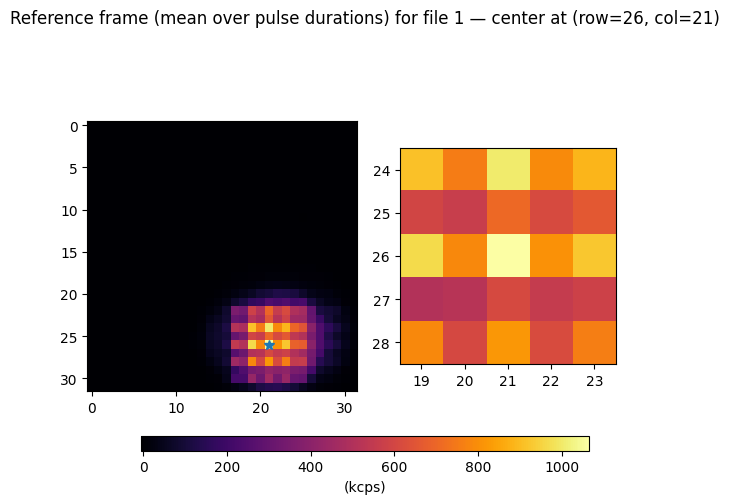

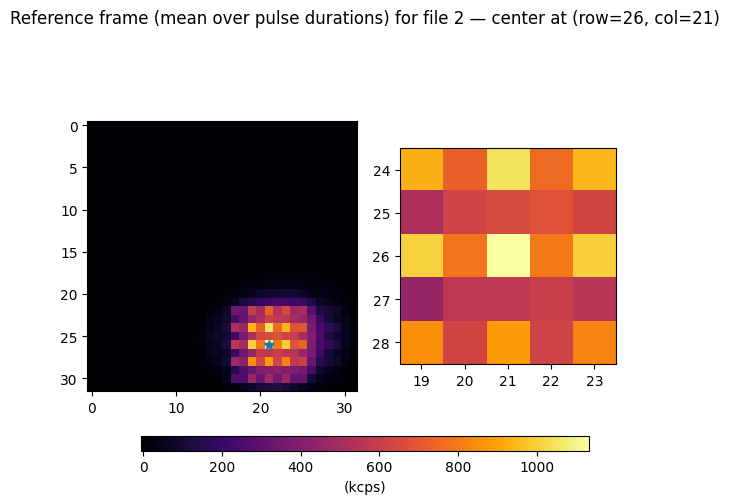

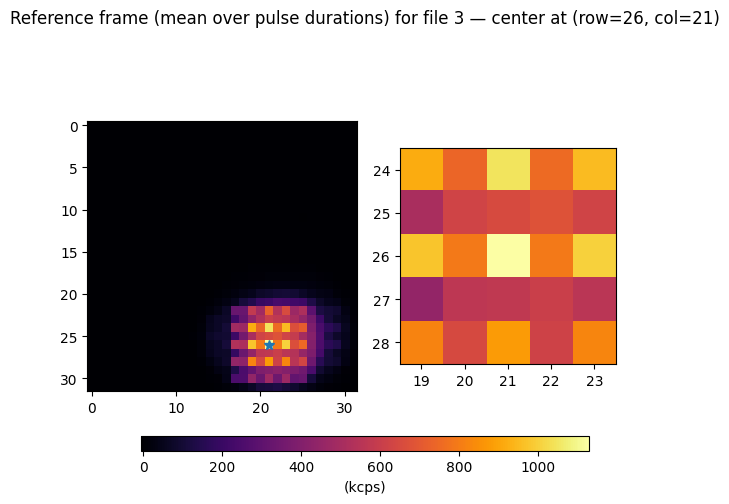

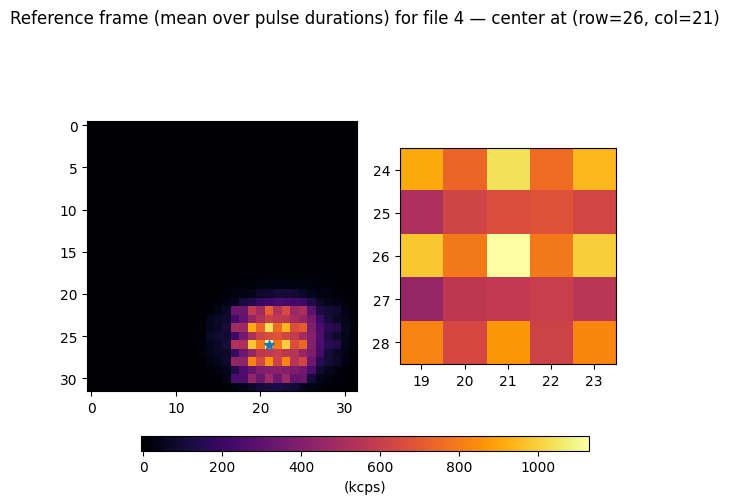

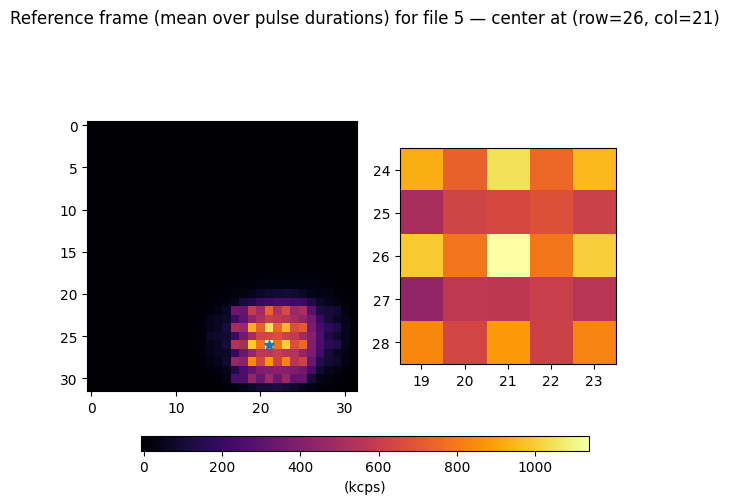

...

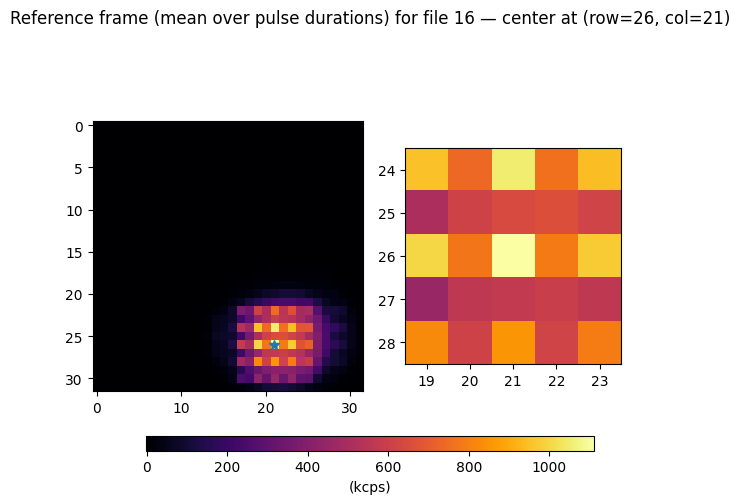

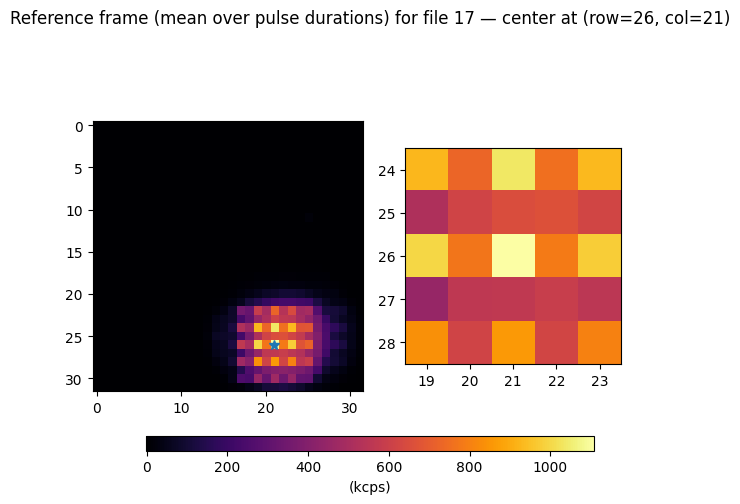

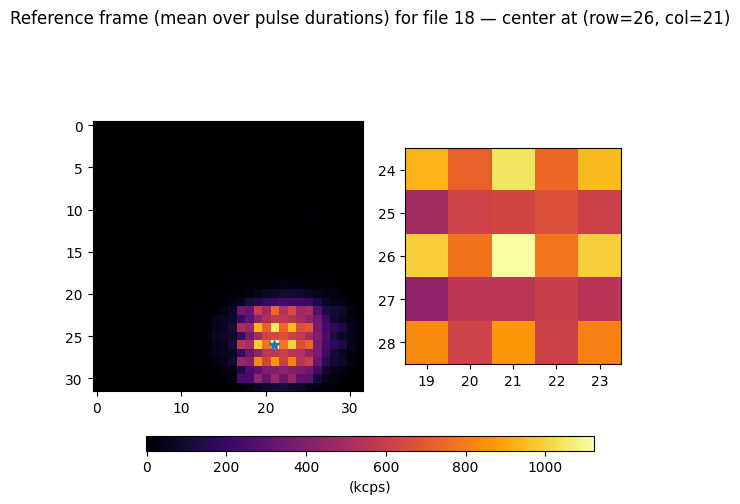

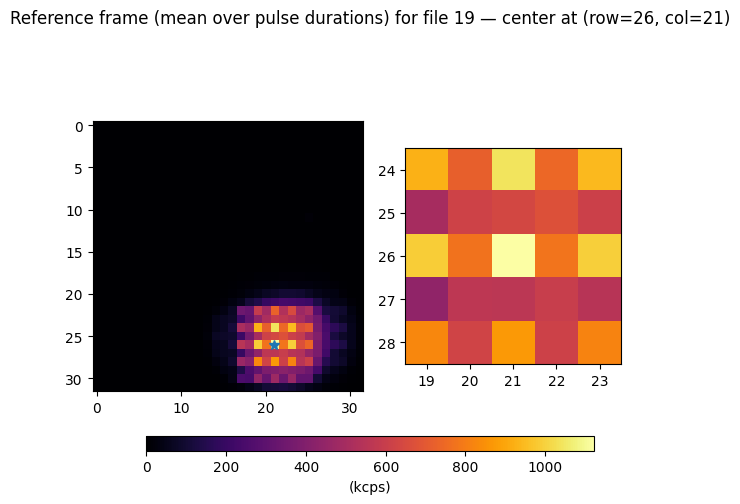

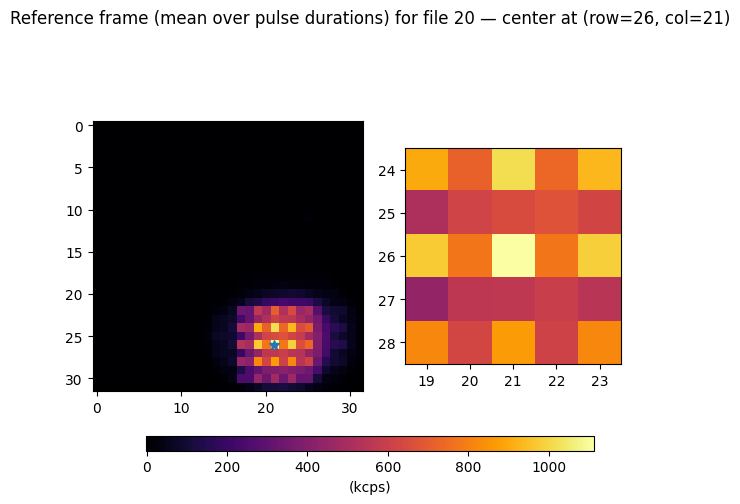

File 1 array centre (brightest pixel in ref_avg.mean): row=26, col=21
File 1 count at array centre: 1065200.0 cps
File 2 array centre (brightest pixel in ref_avg.mean): row=26, col=21
File 2 count at array centre: 1132405.6 cps
File 3 array centre (brightest pixel in ref_avg.mean): row=26, col=21
File 3 count at array centre: 1129630.1 cps
File 4 array centre (brightest pixel in ref_avg.mean): row=26, col=21
File 4 count at array centre: 1128955.1 cps
File 5 array centre (brightest pixel in ref_avg.mean): row=26, col=21
File 5 count at array centre: 1136994.1 cps
File 6 array centre (brightest pixel in ref_avg.mean): row=26, col=21
File 6 count at array centre: 1126120.7 cps
File 7 array centre (brightest pixel in ref_avg.mean): row=26, col=21
File 7 count at array centre: 1136458.9 cps
File 8 array centre (brightest pixel in ref_avg.mean): row=26, col=21
File 8 count at array centre: 1133307.2 cps
File 9 array centre (brightest pixel in ref_avg.mean): row=26, col=21
File 9 count at ar

In [196]:
# Use the mean reference frame (averaged over all pulse durations) to find the array centre.
n = 5  # size of ROI (n x n pixels)

for k in range(len(n_complete_reps_all)):

    ref_frame = ref_avg_cps_bgsub_all[k,:,:].mean(axis=0)  # (rows, cols)
    bright_rc = np.unravel_index(ref_frame.argmax(), ref_frame.shape)

    plt.figure()
    plt.subplot(1,2,1)
    plt.imshow(1e-3*ref_frame, cmap='inferno')
    plt.plot(bright_rc[1], bright_rc[0], '*', ms=7)

    plt.subplot(1, 2, 2)
    plt.imshow(1e-3*ref_frame, cmap='inferno')
    plt.xlim(bright_rc[1]-int(n/2)-0.5, bright_rc[1]+int(n/2)+0.5)
    plt.ylim(bright_rc[0]+int(n/2)+0.5, bright_rc[0]-int(n/2)-0.5)
    plt.colorbar(label='(kcps)')

    fig = plt.gcf()
    ax1, ax2 = fig.axes[0], fig.axes[1]
    for ax_extra in list(fig.axes[2:]):
        ax_extra.remove()

    im1 = ax1.images[-1]
    im2 = ax2.images[-1]
    im2.set_norm(im1.norm)

    cax = fig.add_axes([0.15, 0.06, 0.70, 0.03])
    cax.set_in_layout(False)
    cbar = fig.colorbar(im1, cax=cax, orientation="horizontal")
    cbar.set_label("(kcps)")
    plt.suptitle(f'Reference frame (mean over pulse durations) for file {k+1} — center at (row={bright_rc[0]}, col={bright_rc[1]})')
    plt.tight_layout()

plt.show()

for k in range(len(n_complete_reps_all)):
    ref_frame = ref_avg_cps_bgsub_all[k,:,:].mean(axis=0)
    bright_rc = np.unravel_index(ref_frame.argmax(), ref_frame.shape)
    print(f'File {k+1} array centre (brightest pixel in ref_avg.mean): row={bright_rc[0]}, col={bright_rc[1]}')
    print(f'File {k+1} count at array centre: {ref_frame[bright_rc]:.1f} cps')

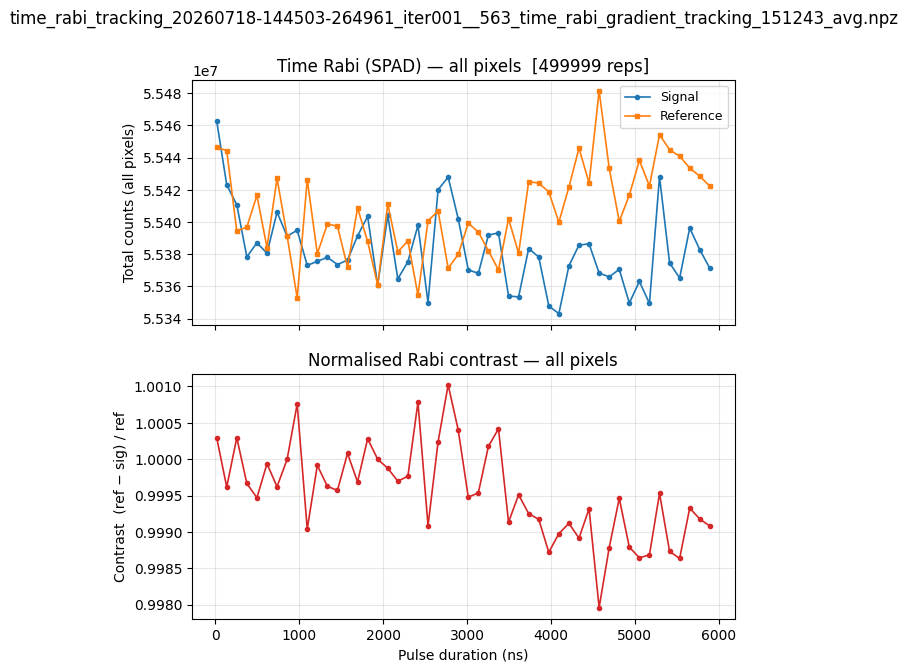

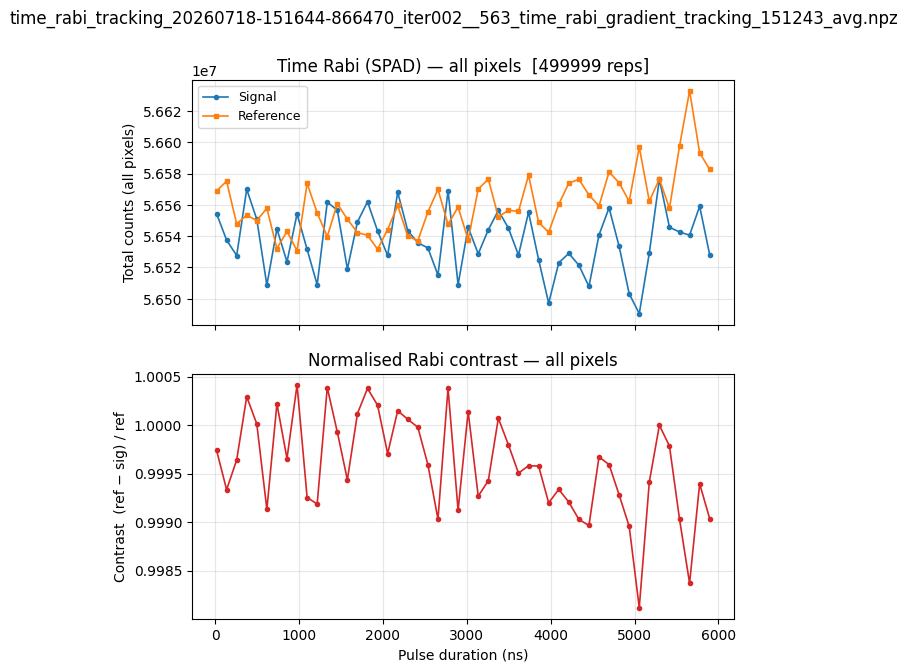

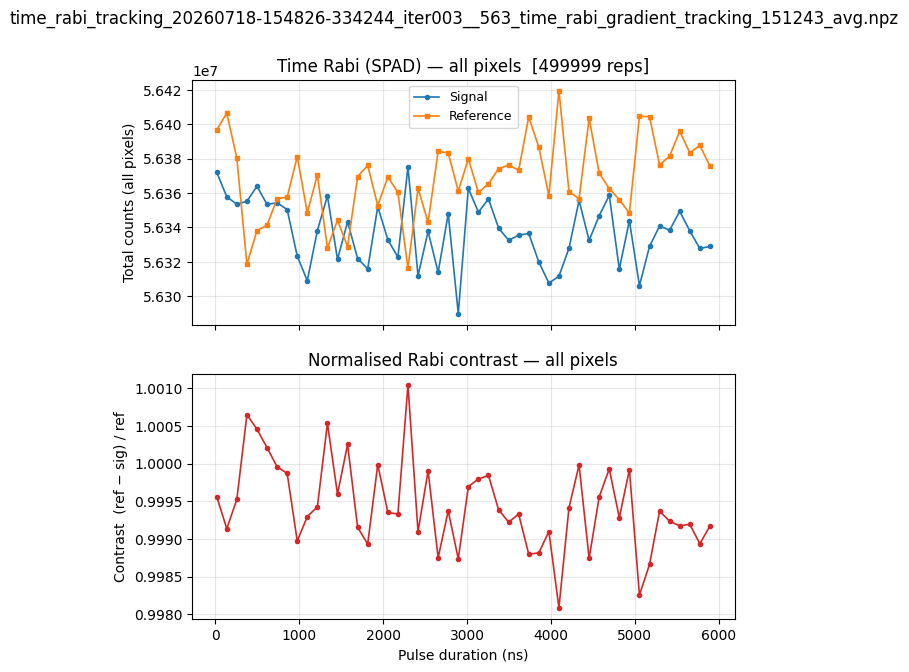

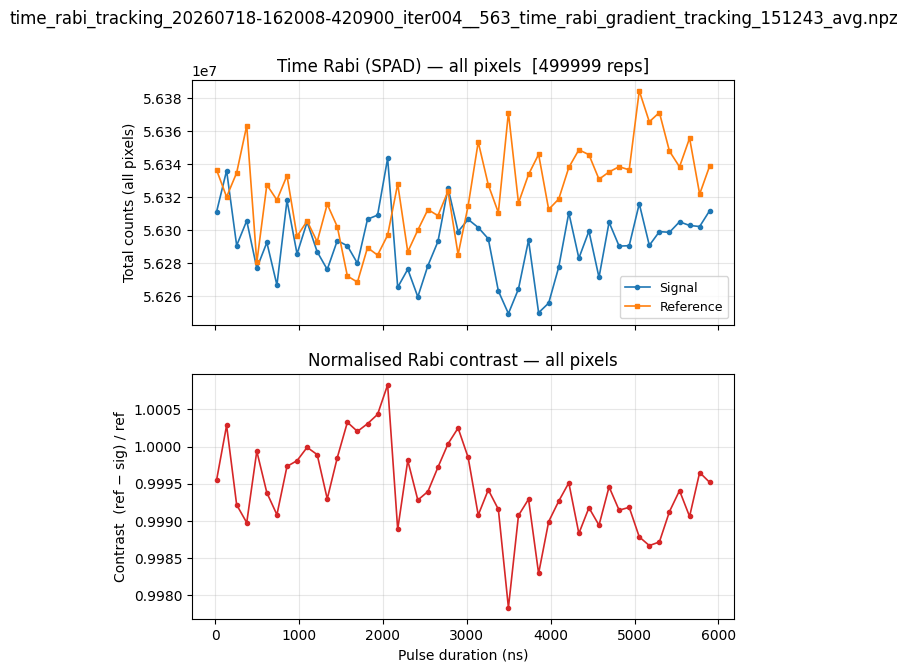

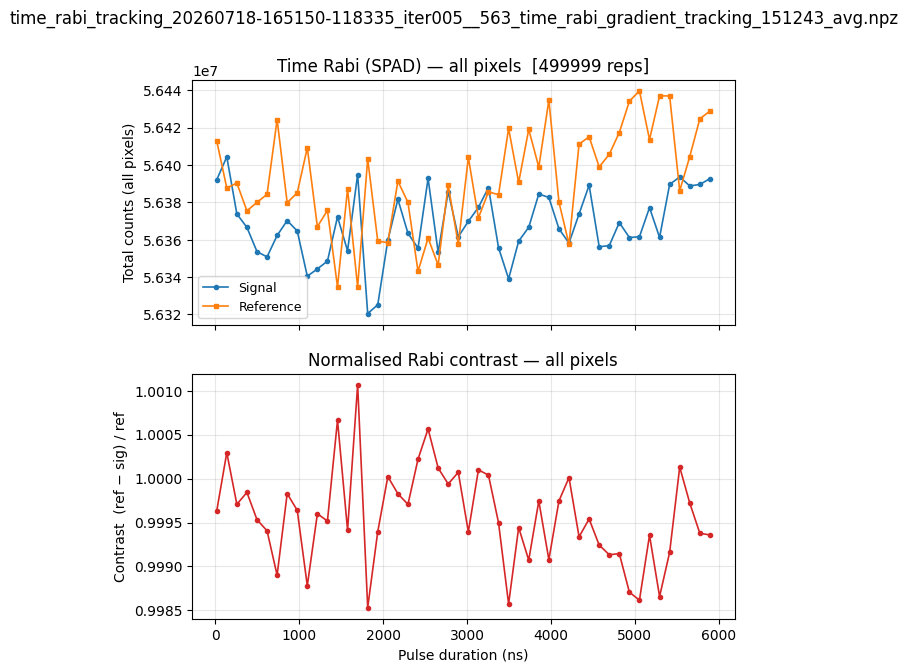

...

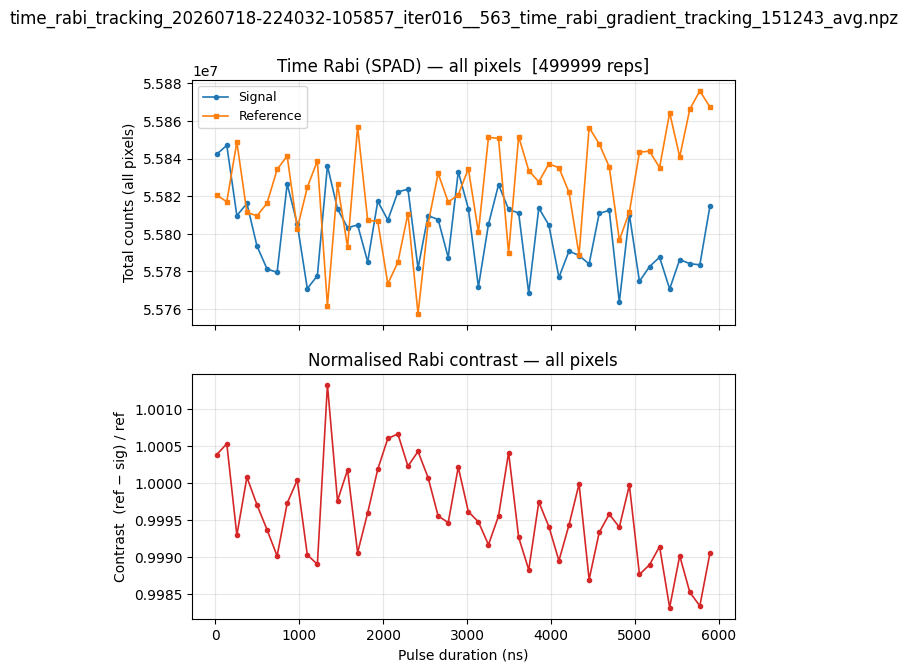

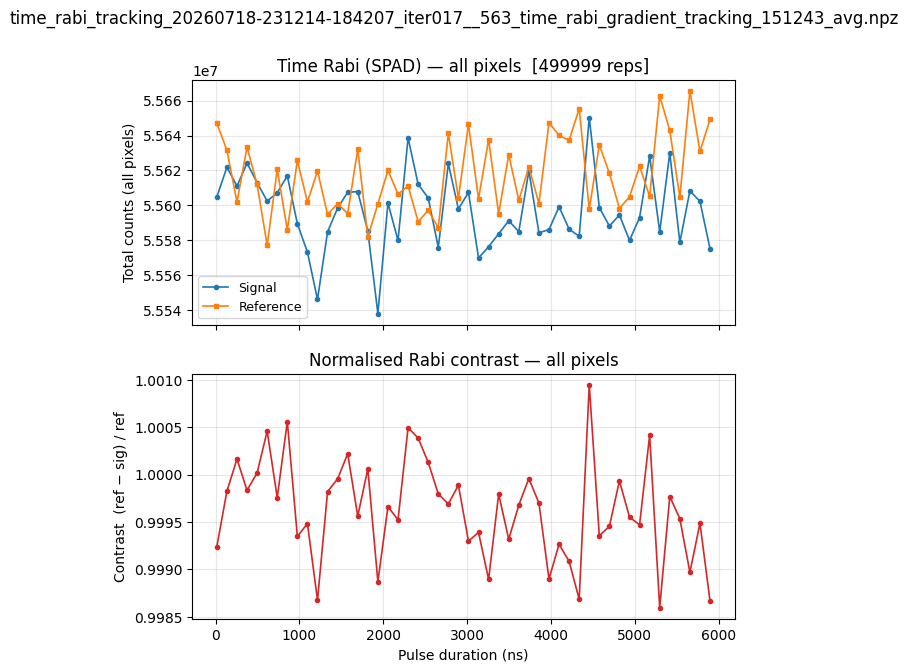

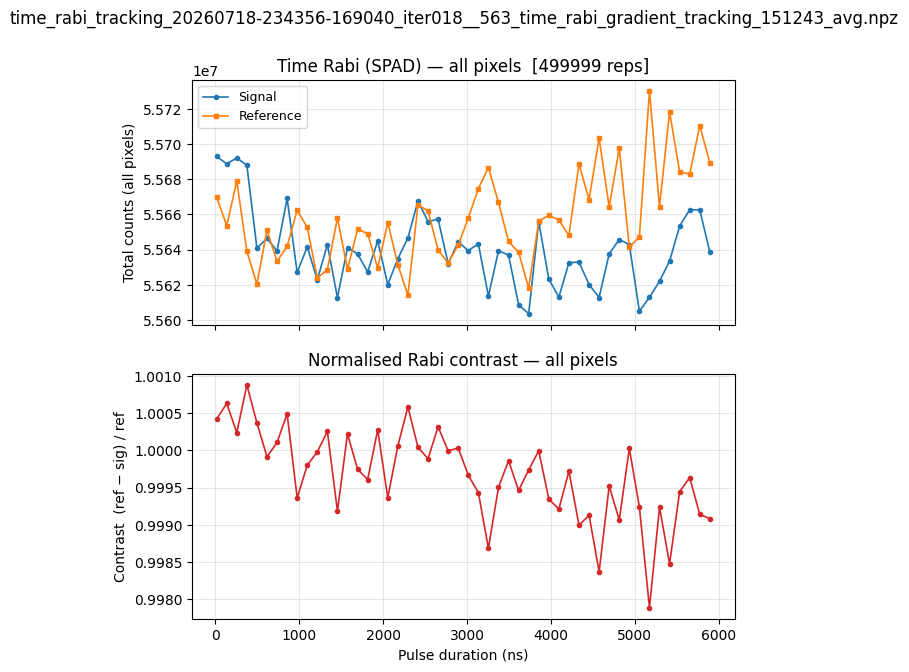

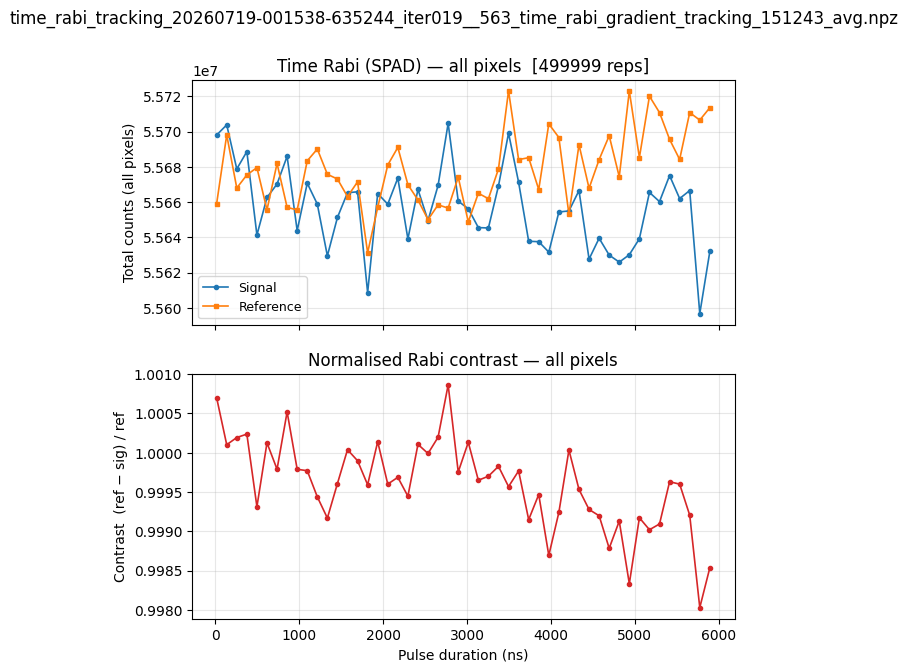

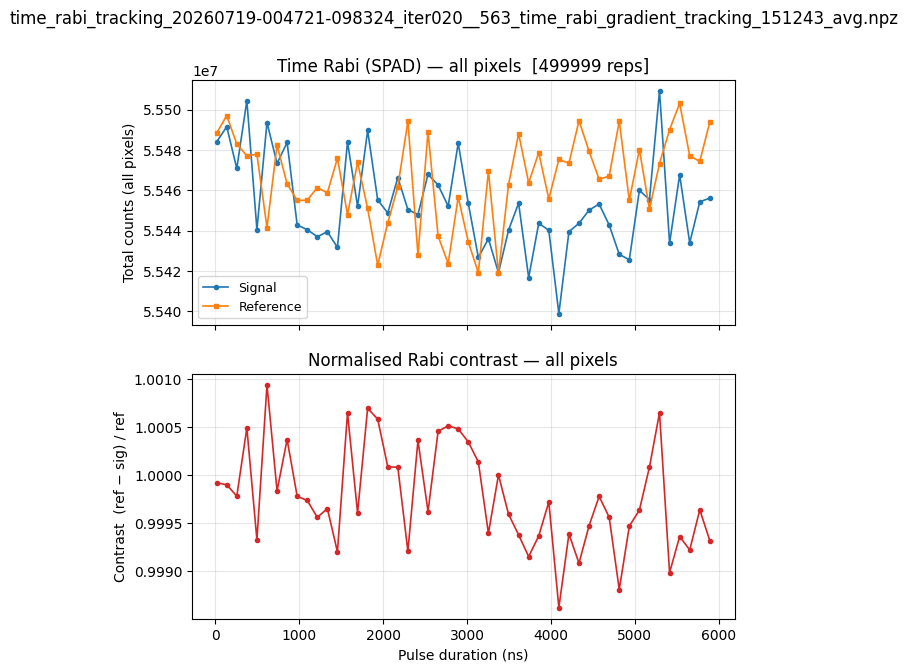

In [197]:
for k in range(len(spad_processed_files)):
    sig_counts = sig_avg_cps_bgsub_all[k,:,:,:].sum(axis=(-1, -2))   # (N,)
    ref_counts = ref_avg_cps_bgsub_all[k,:,:,:].sum(axis=(-1, -2))   # (N,)

    with np.errstate(divide='ignore', invalid='ignore'):
        contrast_all = np.where(ref_counts != 0, 1 - (ref_counts - sig_counts) / ref_counts, 0.0)

    fig, axes = plt.subplots(2, 1, figsize=(7, 7), sharex=True)

    plt.suptitle(f'{list(spad_processed_files)[k]}')
    axes[0].plot(t_vec, sig_counts, 'o-', ms=3, lw=1.2, label='Signal')
    axes[0].plot(t_vec, ref_counts, 's-', ms=3, lw=1.2, label='Reference')
    axes[0].set_ylabel('Total counts (all pixels)')
    axes[0].set_title(f'Time Rabi (SPAD) — all pixels  [{n_complete_reps_all[k]} reps]')
    axes[0].legend(fontsize=9)
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(t_vec, contrast_all, 'o-', ms=3, lw=1.2, color='C3')
    axes[1].set_xlabel('Pulse duration (ns)')
    axes[1].set_ylabel('Contrast  (ref − sig) / ref')
    axes[1].set_title('Normalised Rabi contrast — all pixels')
    axes[1].grid(True, alpha=0.3)

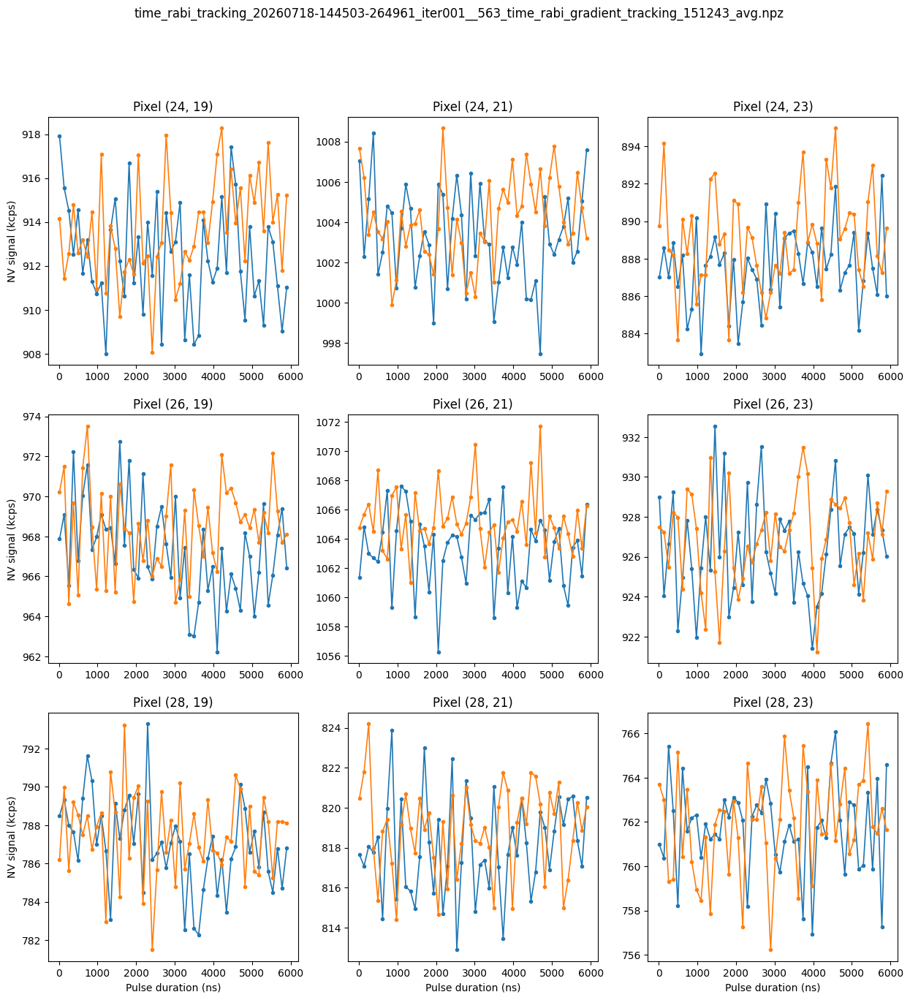

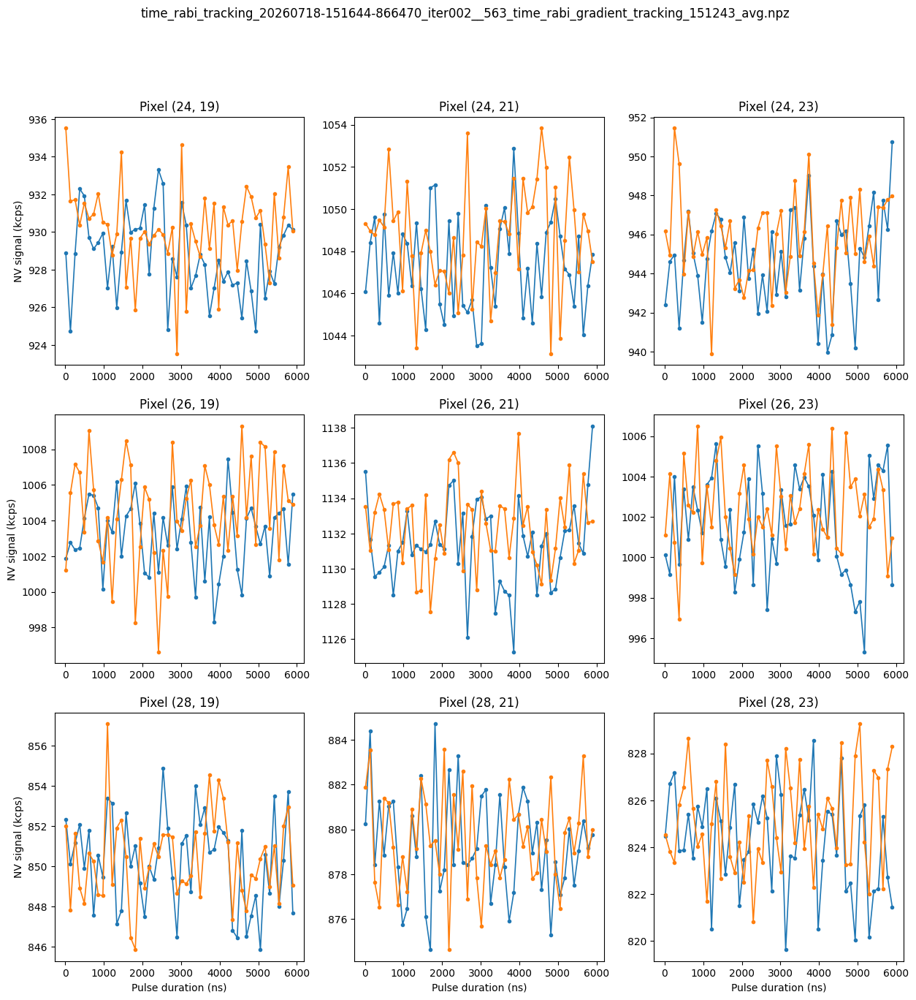

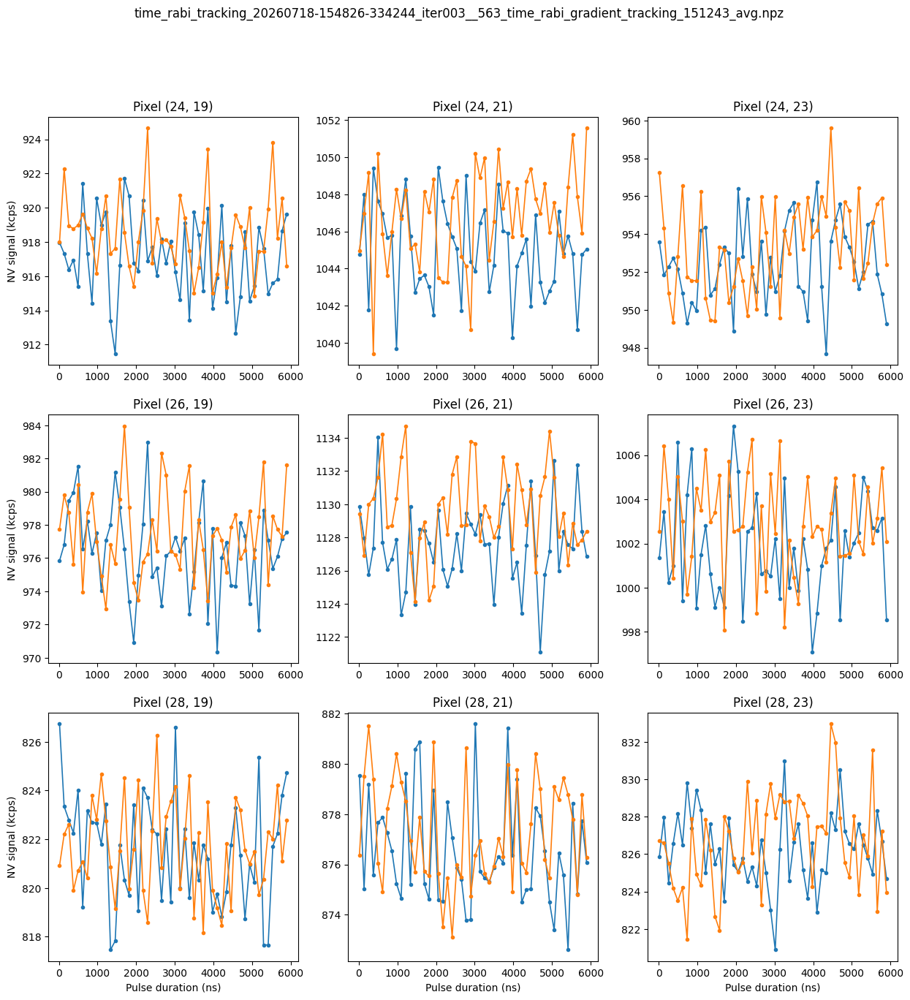

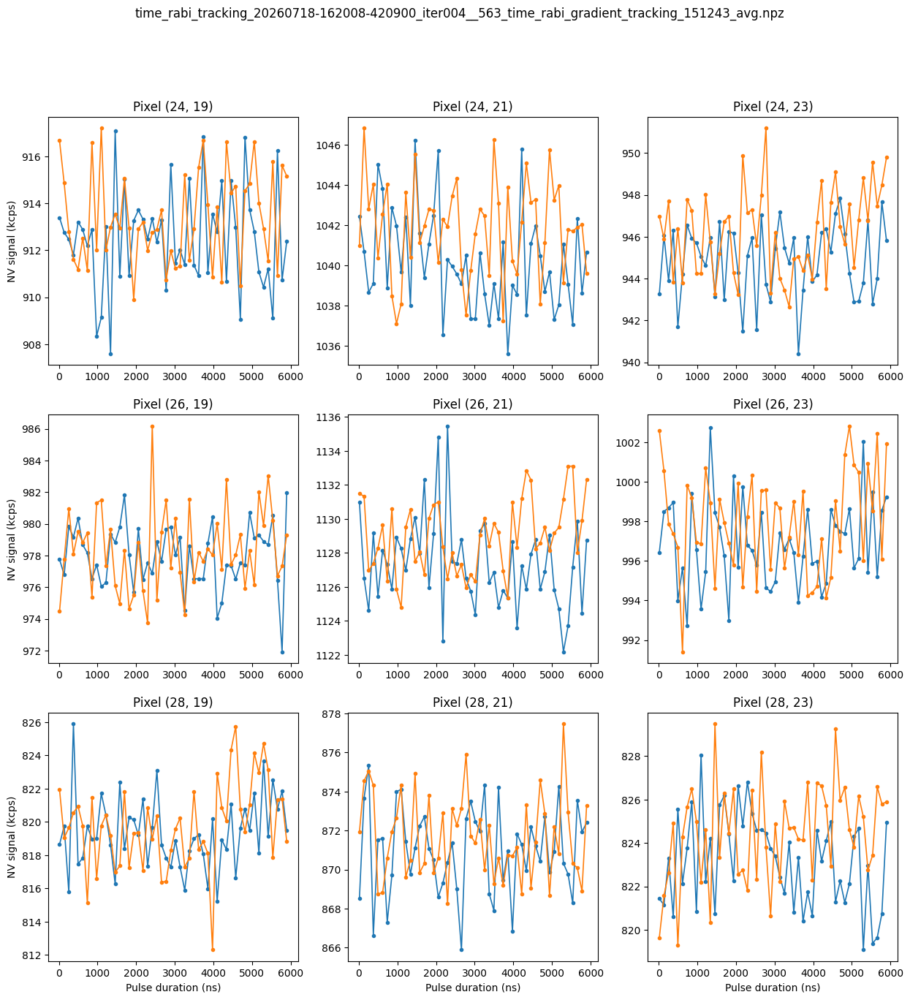

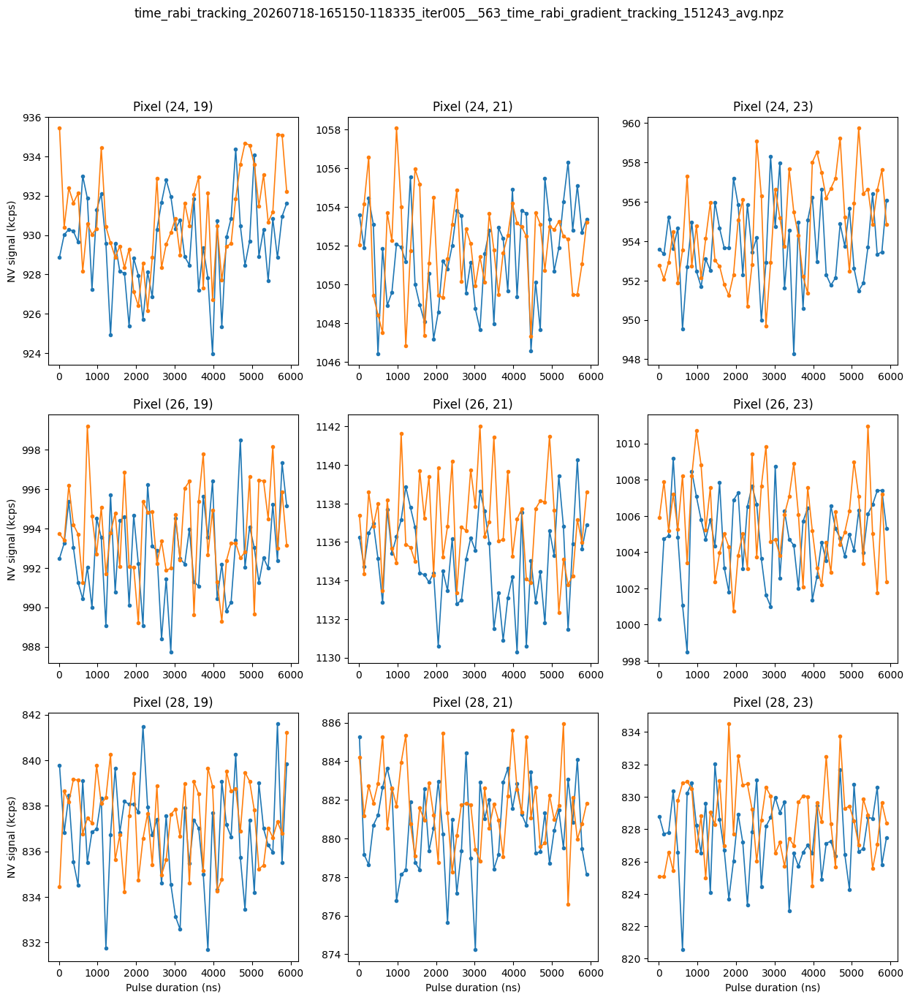

...

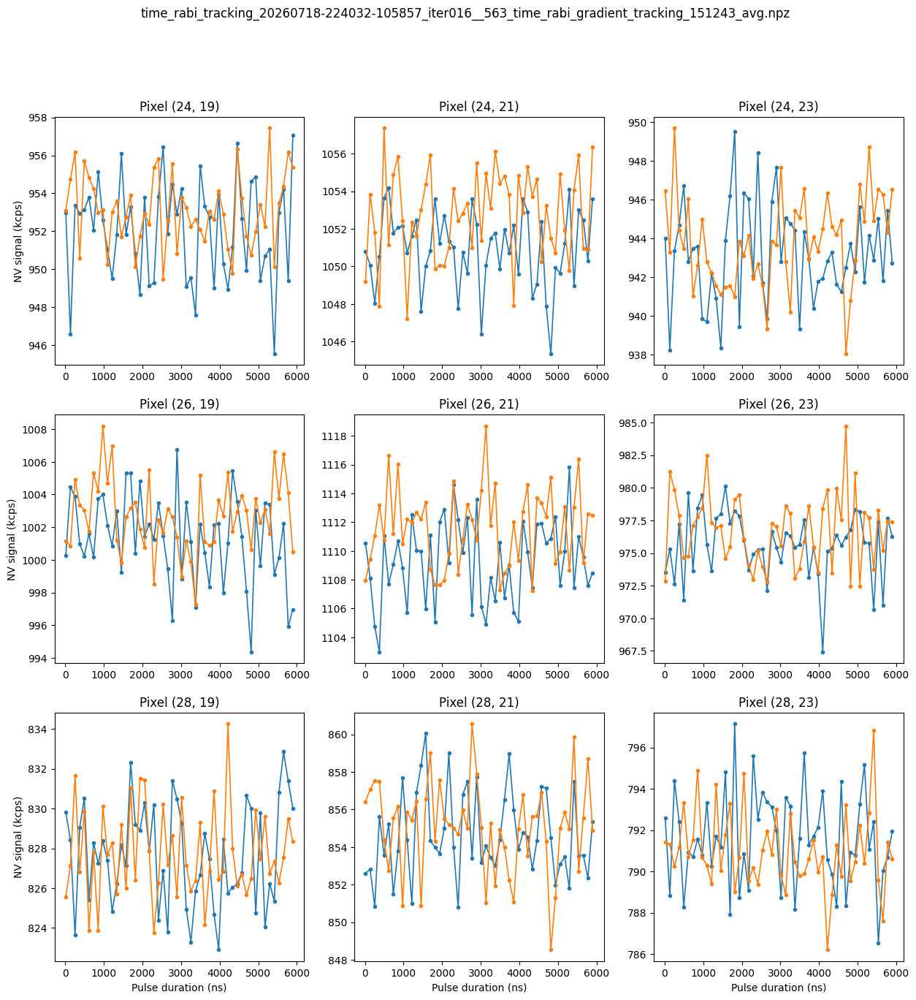

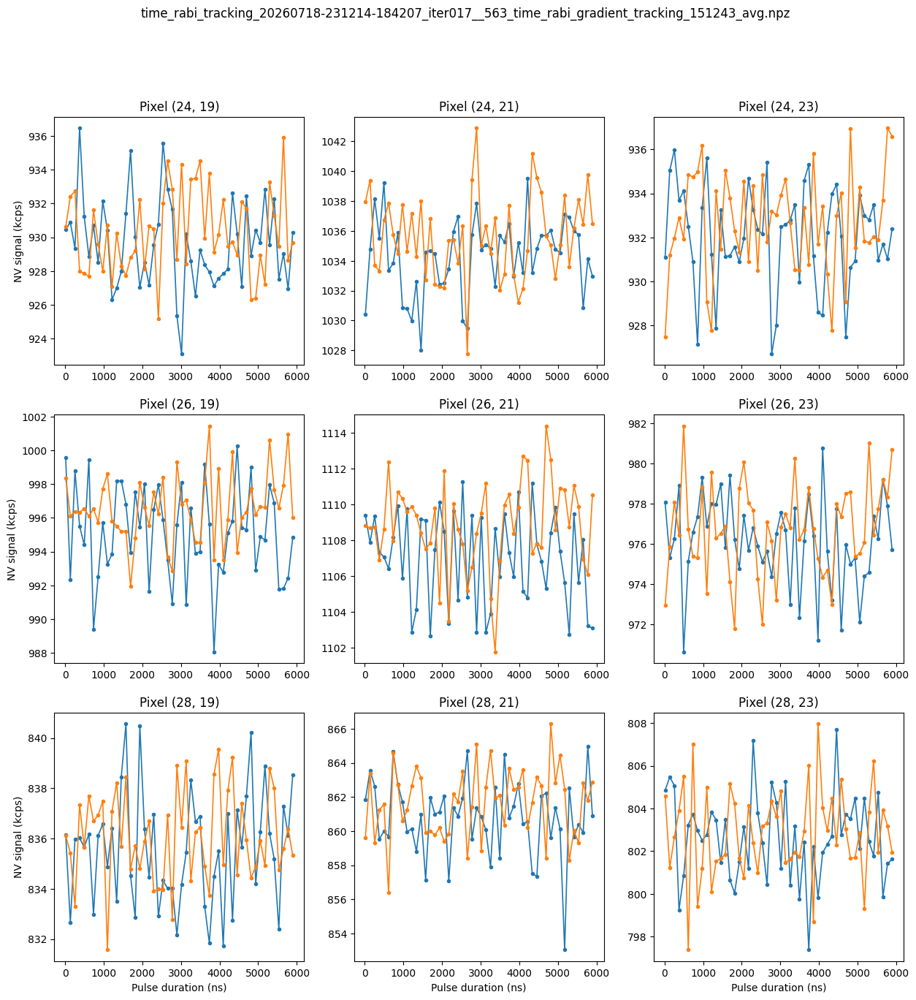

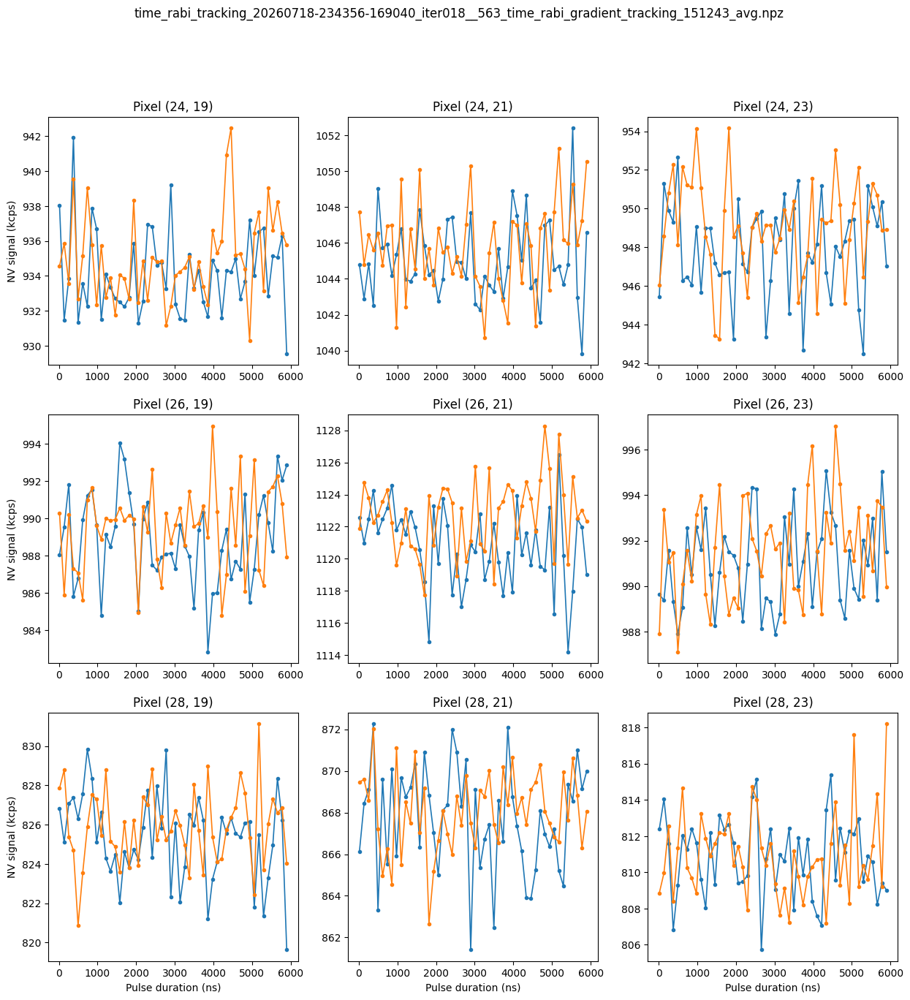

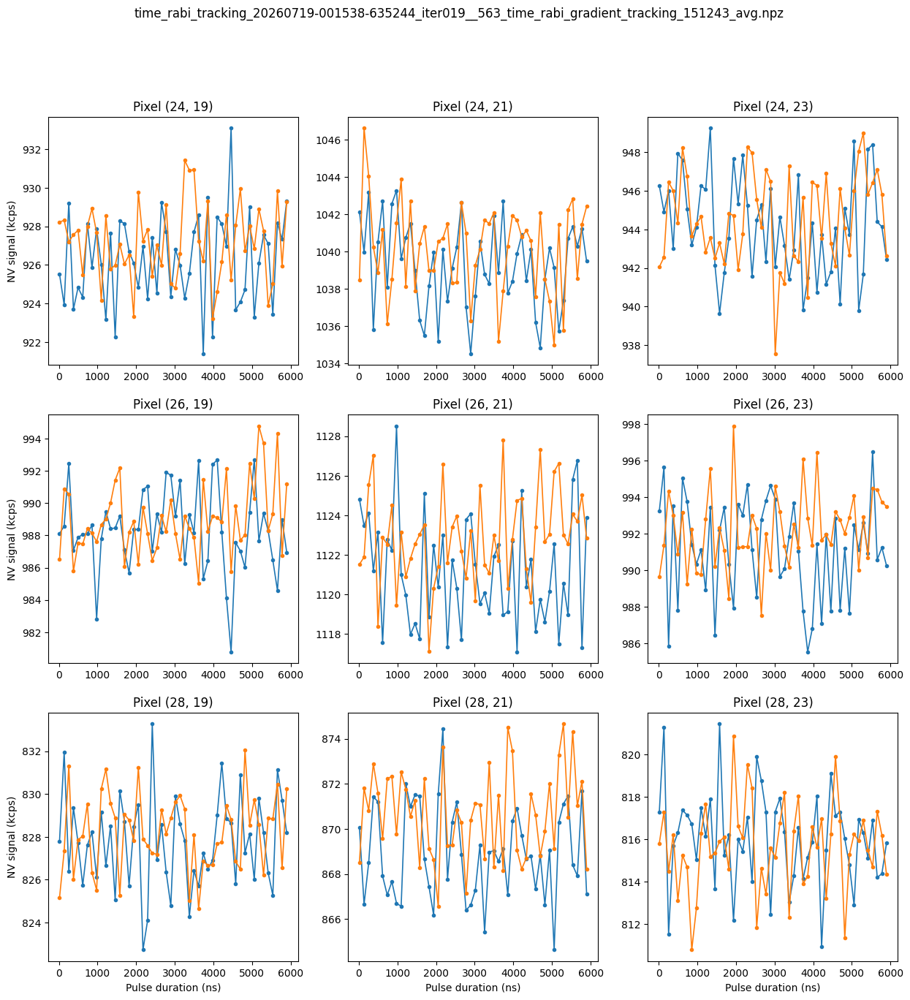

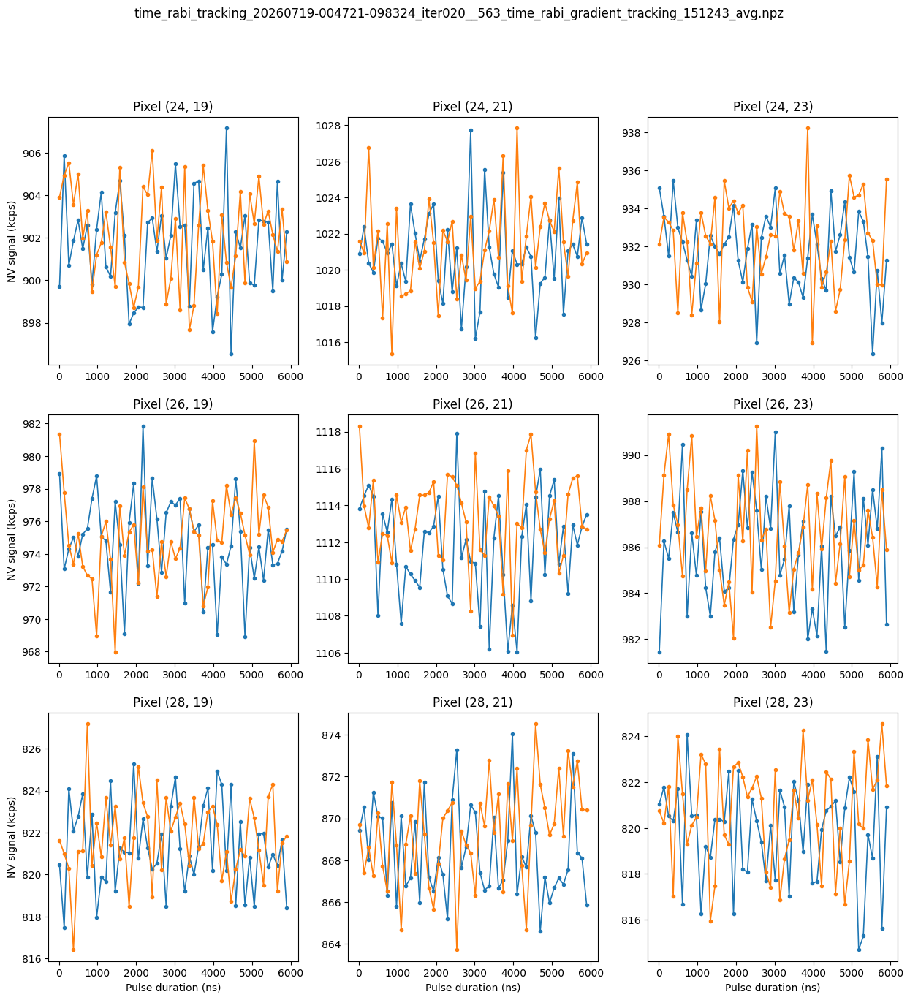

In [198]:
# For each processed file, plot signal and ref for each pixel in 3×3 emitter array centered at brightest pixel
for k in range(len(spad_processed_files)):

    ref_frame = ref_avg_cps_bgsub_all[k, :, :, :].mean(axis=0)
    bright_rc = np.unravel_index(ref_frame.argmax(), ref_frame.shape)

    plt.subplots(3, 3, figsize=(15, 15))

    for i in range(3):
        for j in range(3):
            sig_pix = sig_avg_cps_bgsub_all[k, :, bright_rc[0]+2*i-2, bright_rc[1]+2*j-2]
            ref_pix = ref_avg_cps_bgsub_all[k, :, bright_rc[0]+2*i-2, bright_rc[1]+2*j-2]

            plt.suptitle(f'{list(spad_processed_files)[k]}')
            plt.subplot(3, 3, i*3 + j + 1)
            plt.plot(t_vec, sig_pix/1000, 'o-', ms=3, lw=1.2, label='Signal')
            plt.plot(t_vec, ref_pix/1000, 'o-', ms=3, lw=1.2, label='Reference')
            plt.title(f'Pixel ({bright_rc[0]+2*i-2}, {bright_rc[1]+2*j-2})')
            if i == 2:
                plt.xlabel('Pulse duration (ns)')
            if j == 0:
                plt.ylabel('NV signal (kcps)')

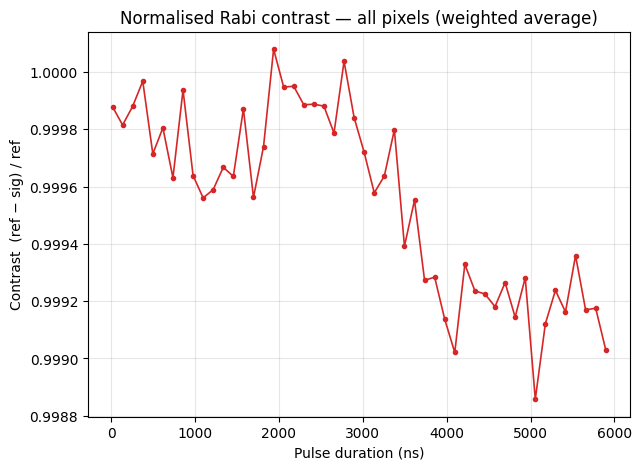

In [199]:
contrast_all = []
# Weighted average contrast across all processed files

for k in range(len(n_complete_reps_all)):
    sig_counts = sig_avg_cps_bgsub_all[k,:,:,:].sum(axis=(-1, -2))   # (N,)
    ref_counts = ref_avg_cps_bgsub_all[k,:,:,:].sum(axis=(-1, -2))   # (N,)

    with np.errstate(divide='ignore', invalid='ignore'):
        contrast = np.where(ref_counts != 0, 1 - (ref_counts - sig_counts) / ref_counts, 0.0)

    contrast_all.append(contrast)

contrast_all = np.array(contrast_all)
contrast_ave = np.average(contrast_all, axis=0, weights=n_complete_reps_all)

plt.figure(figsize=(7, 5))
plt.plot(t_vec, contrast_ave, 'o-', ms=3, lw=1.2, color='C3')
plt.xlabel('Pulse duration (ns)')
plt.ylabel('Contrast  (ref − sig) / ref')
plt.title('Normalised Rabi contrast — all pixels (weighted average)')
plt.grid(True, alpha=0.3)

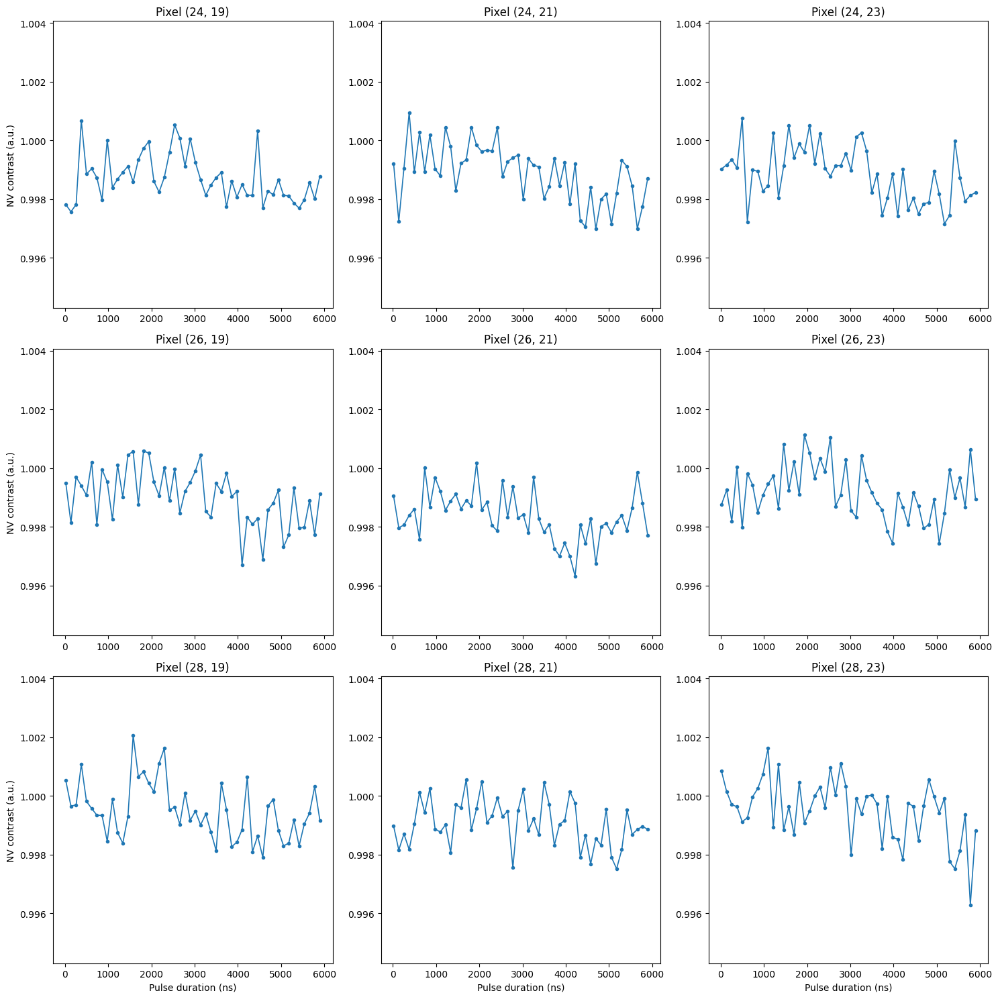

In [200]:
# Weighted average contrast for 3×3 grid

# --- pass 1: compute contrasts ---
pixel_data = []
for i in range(3):
    for j in range(3):
        sig_norm_pix_all = []
        for k in range(len(n_complete_reps_all)):
            ref_frame = ref_avg_cps_bgsub_all[k, :, :, :].mean(axis=0)
            bright_rc = np.unravel_index(ref_frame.argmax(), ref_frame.shape)
            sig_pix = sig_avg_cps_bgsub_all[k, :, bright_rc[0]+2*i-2, bright_rc[1]+2*j-2]
            ref_pix = ref_avg_cps_bgsub_all[k, :, bright_rc[0]+2*i-2, bright_rc[1]+2*j-2]
            sig_norm_pix_all.append(1 - ((ref_pix - sig_pix) / ref_pix))

        sig_norm_pix_all = np.array(sig_norm_pix_all)
        sig_norm_pix_avg = np.average(sig_norm_pix_all, axis=0, weights=n_complete_reps_all)
        row, col = bright_rc[0]+2*i-2, bright_rc[1]+2*j-2

        pixel_data.append(dict(row=row, col=col, contrast=sig_norm_pix_avg))

# shared y limits
all_vals = np.concatenate([d['contrast'] for d in pixel_data])
ylo = 0.998 * all_vals.min()
yhi = 1.002 * all_vals.max()

# --- pass 2: plot ---
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

for idx, d in enumerate(pixel_data):
    i, j = idx // 3, idx % 3
    ax = axes[i, j]
    ax.plot(t_vec, d['contrast'], 'o-', ms=3, lw=1.2, label='Data')
    ax.set_title(f"Pixel ({d['row']}, {d['col']})")
    ax.set_ylim(ylo, yhi)
    if i == 2:
        ax.set_xlabel('Pulse duration (ns)')
    if j == 0:
        ax.set_ylabel('NV contrast (a.u.)')

fig.tight_layout()
plt.show()

Amplitude-weighted average FFT peak frequency across all pixels: 0.1667 MHz (-> 3000.0 ns pi-pulse guess)


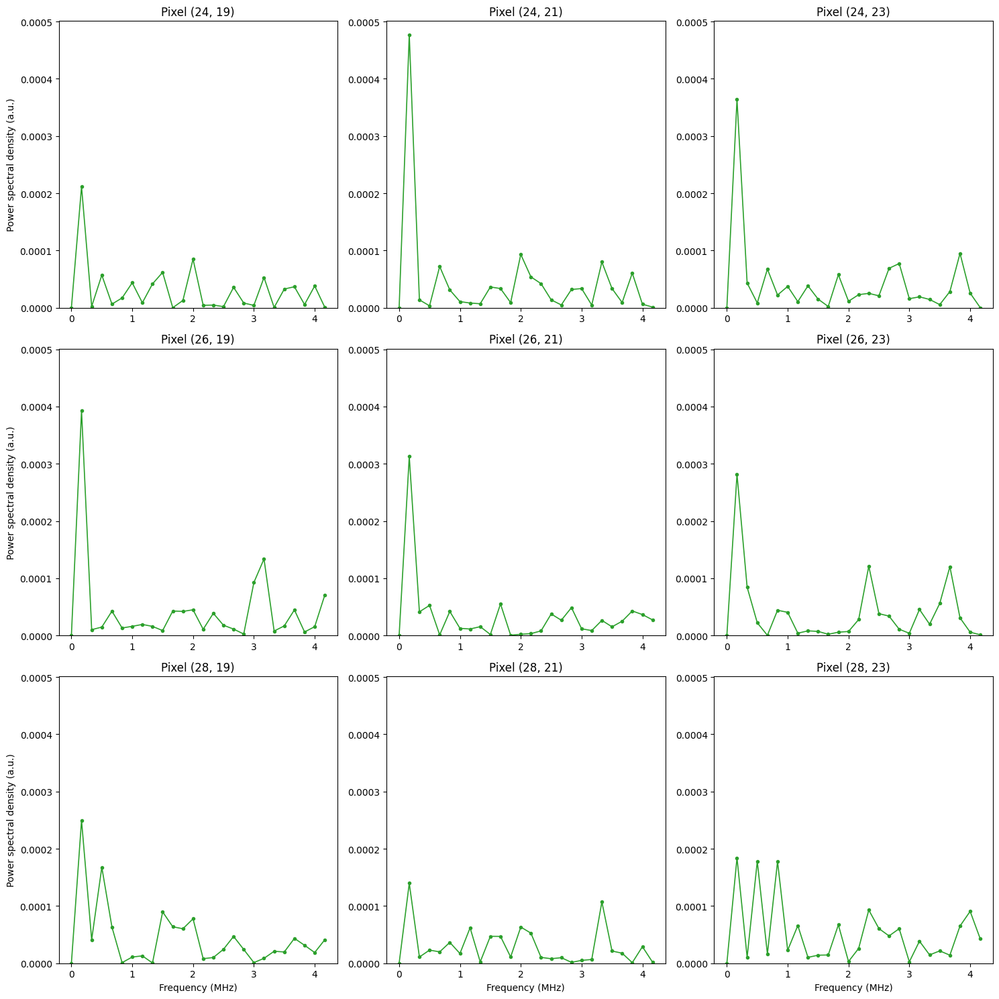

In [201]:
# FFT of the 3×3 pixel contrast traces (from pixel_data computed above)

FIND_PEAK = False  # set False to skip marking the dominant frequency

dt = t_vec[1] - t_vec[0]
freqs_cyc_per_ns = np.fft.rfftfreq(len(t_vec), d=dt)  # cycles/ns, matches t_vec units — used as the fit frequency guess below
freqs_mhz = freqs_cyc_per_ns * 1000  # cycles/ns -> MHz

# --- pass 1: compute spectra ---
spectra = [np.abs(np.fft.rfft(d['contrast'] - d['contrast'].mean()))**2 for d in pixel_data]

# dominant (non-DC) frequency per pixel, averaged across all pixels weighted by peak amplitude -> initial guess for the damped-cosine fit
peak_idxs = [np.argmax(s[1:]) + 1 for s in spectra]
peak_freqs_cyc_per_ns = np.array([freqs_cyc_per_ns[idx] for idx in peak_idxs])
peak_amps = np.array([np.sqrt(s[idx]) for s, idx in zip(spectra, peak_idxs)])
freq_guess_avg = np.average(peak_freqs_cyc_per_ns, weights=peak_amps)
print(f"Amplitude-weighted average FFT peak frequency across all pixels: {freq_guess_avg*1000:.4f} MHz "
      f"(-> {0.5/freq_guess_avg:.1f} ns pi-pulse guess)")

# shared y limits
all_vals = np.concatenate(spectra)
ylo = 0.0
yhi = 1.05 * all_vals.max()

# --- pass 2: plot ---
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

for idx, (d, spectrum) in enumerate(zip(pixel_data, spectra)):
    i, j = idx // 3, idx % 3
    ax = axes[i, j]

    ax.plot(freqs_mhz, spectrum, 'o-', ms=3, lw=1.2, color='C2')
    if FIND_PEAK:
        peak_idx = np.argmax(spectrum[1:]) + 1  # skip DC bin
        ax.axvline(freqs_mhz[peak_idx], color='r', ls='--', lw=1,
                   label=f'{freqs_mhz[peak_idx]:.2f} MHz')
        ax.legend(fontsize=7)
    ax.set_title(f"Pixel ({d['row']}, {d['col']})")
    ax.set_ylim(ylo, yhi)
    if i == 2:
        ax.set_xlabel('Frequency (MHz)')
    if j == 0:
        ax.set_ylabel('Power spectral density (a.u.)')

fig.tight_layout()
plt.show()

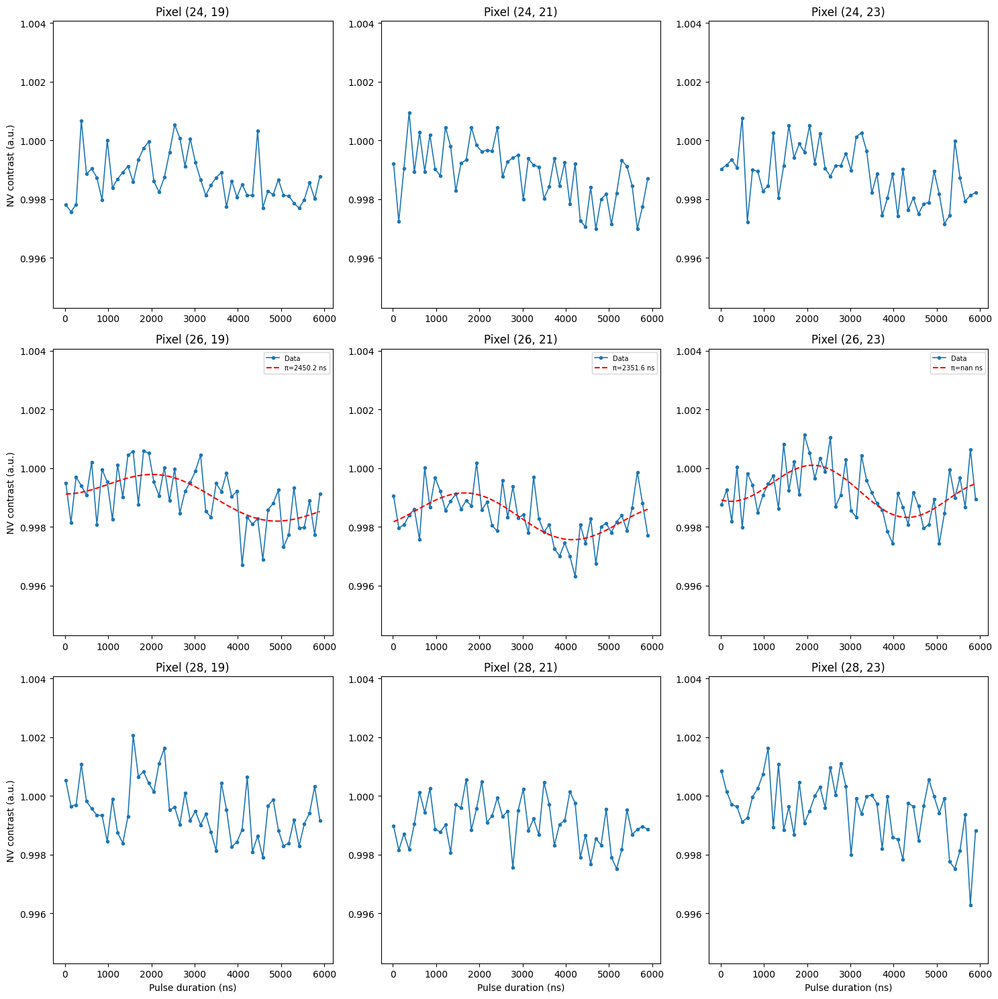


Per-pixel fit results:
  Pixel (24,19):  fit failed / skipped
  Pixel (24,21):  fit failed / skipped
  Pixel (24,23):  fit failed / skipped
  Pixel (26,19):  π-pulse=2450.19 ns  amp=0.0005447  decay=31586794.9 ns  SNR=0.73
  Pixel (26,21):  π-pulse=2351.57 ns  amp=0.0006861  decay=1416399175.5 ns  SNR=1.07
  Pixel (26,23):  π-pulse=nan ns  amp=-0.0007478  decay=82664355.2 ns  SNR=1.05
  Pixel (28,19):  fit failed / skipped
  Pixel (28,21):  fit failed / skipped
  Pixel (28,23):  fit failed / skipped


In [202]:
# Damped-cosine fit per pixel — frequency initial guess taken from the FFT peak (averaged over all pixels, above)

DO_FIT = True  # set False to skip the damped-cosine fit and just report status
FIT_ROW = 1  # set to 0, 1, or 2 to fit only that row of the 3x3 grid and skip the other two; None fits all rows

def damped_cosine(t, amp, freq, phase, decay, offset, slope):
    return offset + slope * t + amp * np.cos(2 * np.pi * freq * t + phase) * np.exp(-t / decay)

def fit_rabi(t, y, freq_guess):
    amp_guess = (y.max() - y.min()) / 2
    offset_guess = y.mean()
    decay_guess = t[-1] / 2
    slope_guess = (y.max() - y.min()) / (t[-1] - t[0])
    p0 = [amp_guess, freq_guess, 0.0, decay_guess, offset_guess, slope_guess]
    try:
        popt, _ = curve_fit(damped_cosine, t, y, p0=p0, maxfev=10000)
        return popt
    except Exception:
        return None

for idx, d in enumerate(pixel_data):
    i = idx // 3
    do_fit_this_row = DO_FIT and (FIT_ROW is None or i == FIT_ROW)
    if do_fit_this_row:
        popt = fit_rabi(t_vec, d['contrast'], freq_guess_avg)
    else:
        popt = None

    if popt is not None:
        y_fit = damped_cosine(t_vec, *popt)
        pi_pulse_ns = 0.5 / popt[1] if popt[1] > 0 else np.nan
        fit_ok = True
        residual = d['contrast'] - y_fit
        residual_rms = np.sqrt(np.mean(residual ** 2))
        snr = np.abs(popt[0]) / residual_rms if residual_rms > 0 else np.inf
    else:
        y_fit = None
        pi_pulse_ns = np.nan
        fit_ok = False
        residual_rms = np.nan
        snr = np.nan

    d.update(popt=popt, y_fit=y_fit, pi_pulse_ns=pi_pulse_ns,
             fit_ok=fit_ok, residual_rms=residual_rms, snr=snr)

# shared y limits
all_vals = np.concatenate([d['contrast'] for d in pixel_data])
ylo = 0.998 * all_vals.min()
yhi = 1.002 * all_vals.max()

# --- plot ---
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

for idx, d in enumerate(pixel_data):
    i, j = idx // 3, idx % 3
    ax = axes[i, j]
    ax.plot(t_vec, d['contrast'], 'o-', ms=3, lw=1.2, label='Data')
    if d['fit_ok']:
        ax.plot(t_vec, d['y_fit'], 'r--', lw=1.5,
                label=f"π={d['pi_pulse_ns']:.1f} ns")
        ax.legend(fontsize=7)
    ax.set_title(f"Pixel ({d['row']}, {d['col']})")
    ax.set_ylim(ylo, yhi)
    if i == 2:
        ax.set_xlabel('Pulse duration (ns)')
    if j == 0:
        ax.set_ylabel('NV contrast (a.u.)')

fig.tight_layout()
plt.show()

if DO_FIT:
    print("\nPer-pixel fit results:")
    for d in pixel_data:
        if d['fit_ok']:
            print(f"  Pixel ({d['row']:2d},{d['col']:2d}):  "
                  f"π-pulse={d['pi_pulse_ns']:.2f} ns  "
                  f"amp={d['popt'][0]:.4g}  "
                  f"decay={d['popt'][3]:.1f} ns  "
                  f"SNR={d['snr']:.2f}")
        else:
            print(f"  Pixel ({d['row']:2d},{d['col']:2d}):  fit failed / skipped")